# Data Science Lab: Lab 2

All the data sets you will need for this lab are in Canvas/Files/Lab files.

Submit:

A read-only link to your colab notebook, executed and saved (so that we can run it, but don't necessarily have to, to see your results).

For any questions that require written explanation, please use Markdown - it is a lot easier for us to read than comments in the code.

**If you used any AI help, please describe how you used it and what you used.**

**Goals of this Lab:**

1. Continue reviewing some important tools from probability and linear algebra, and linking these to why we need them for data science, and how to use them in Python.
2. Specifically: the relationship between the covariance matrix and how skewed data points are. How to skew and unskew.
3. Non linear regression
4. The solution to a ML problem as a random variable.


In [1]:
# Some useful libraries
import numpy as np
import scipy as sp
import math

#Pandas for data structure and analysis tools
import pandas as pd

#seaborn and matplotlib for plotting
import seaborn as sns
import matplotlib.pyplot as plt

#for nice vector graphics
%matplotlib inline

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

from numpy.random import default_rng
np.random.seed(42) # Fixed seed for reproducibility
rng = default_rng()

/tmp/ipykernel_3844/827439876.py:17: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png', 'pdf')


# Problem 1 (Nothing to turn in, but not optional 😀)

Go over the notebook I have posted on [Data Transformations and unskewing data](https://colab.research.google.com/drive/1ML46V9MdNnV_u2gs9aVZdAYEGF6rAtlE?usp=sharing) (also posted in Pages in Canvas). We did not have time to cover this because of the snow-day, but it is important to understand and we will need these ideas later in the class.

Things to understand:

1. How to calculate the covariance of data points.
2. The relationship of the eigenvectors and eigenvalues of the covariance matrix, and the shape of the cloud of data points.
3. How to rescale the data so that this cloud looks more like a sphere, i.e., so that the rescaled data have covariance equal to the identity matrix (ones of the diagonal, zeros everywhere else).







# Problem 2

**Correlations.**

* When given a data matrix, an easy way to tell if any two columns are correlated is to look at a scatter plot of each column against each other column.  For a warm up, do this: Look at the data in DF1 in Canvas.  Which columns are (pairwise) correlated?  Figure out how to do this with Pandas, and also how to do this with Seaborn.

* Compute the covariance matrix of the data.  You can use  any  command  you  like for this (e.g.,  np.cov)  to  compute  the  4×4  matrix. Explain why the numbers that you get fit with the plots you got.

In [2]:
# Load in data
data_matrix = pd.read_csv("DF1", index_col=0)
data_matrix.head()

,0,1,2,3
0,1.038502,0.899865,0.835053,-0.971528
1,0.320455,-0.647459,0.149079,0.352593
2,0.055480,2.234771,0.271672,-2.108739
3,-0.007260,-0.524299,-0.126550,0.670827
4,-1.237390,-1.377017,-1.049932,1.342079


In [3]:
# column column pairs
column_pairs = [(col1, col2) for col1 in data_matrix.columns for col2 in data_matrix.columns if col1 != col2]
print(column_pairs)

[('0', '1'), ('0', '2'), ('0', '3'), ('1', '0'), ('1', '2'), ('1', '3'), ('2', '0'), ('2', '1'), ('2', '3'), ('3', '0'), ('3', '1'), ('3', '2')]


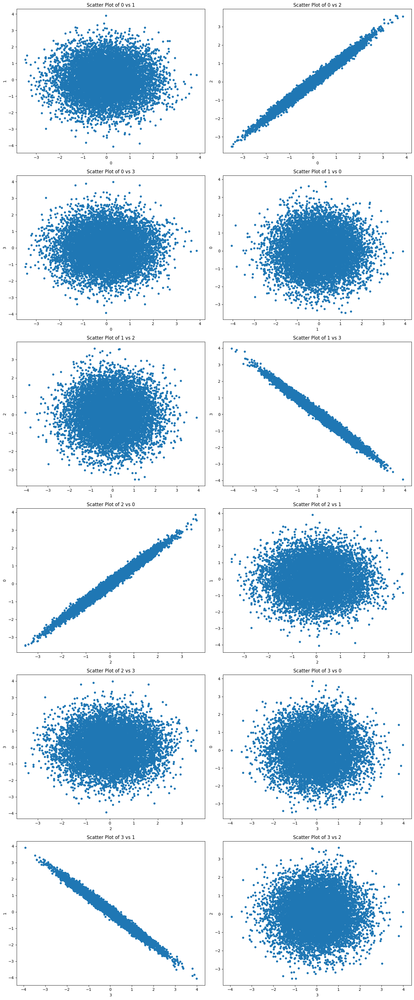

In [4]:
# plotting with pandas
rows = (len(column_pairs) + 1) // 2
fig, axes = plt.subplots(rows, 2, figsize=(15, 6 * rows))
for i, (col1, col2) in enumerate(column_pairs):
    row = i // 2
    col = i % 2
    data_matrix.plot.scatter(x=col1, y=col2, ax=axes[row, col])
    axes[row, col].set_ylabel(col2)
    axes[row, col].set_xlabel(col1)
    axes[row, col].set_title(f'Scatter Plot of {col1} vs {col2}')

if len(column_pairs) % 2 != 0:
    axes[-1, -1].set_visible(False)

plt.tight_layout()
plt.show()

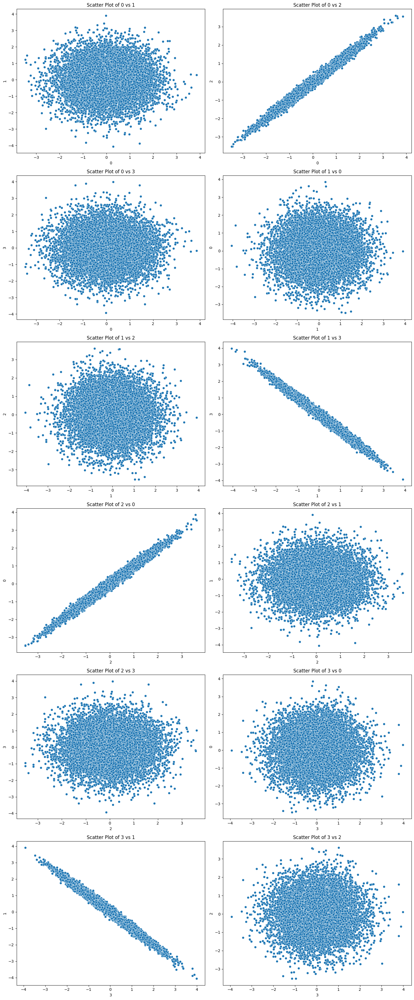

In [5]:
# plotting with seaborn
rows = (len(column_pairs) + 1) // 2
fig, axes = plt.subplots(rows, 2, figsize=(15, 6 * rows))
for i, (col1, col2) in enumerate(column_pairs):
    row = i // 2
    col = i % 2
    sns.scatterplot(x=data_matrix[col1], y=data_matrix[col2], ax=axes[row, col])
    axes[row, col].set_ylabel(col2)
    axes[row, col].set_xlabel(col1)
    axes[row, col].set_title(f'Scatter Plot of {col1} vs {col2}')

if len(column_pairs) % 2 != 0:
    axes[-1, -1].set_visible(False)

plt.tight_layout()
plt.show()

Columns 0 and 2 are pairwise correlated. Columns 1 and 3 are pairwise correlated. This is because there is a clear relationship where a change in the vlaues of one column tells us about the values of the other columnds for theses columns, indicating that the data is related and thus correlated. Columns 1 and 3 should have covariance of around -1, as an increase of one in one of the column tells us that the other column value has decrease of 1, while columns 0 and 2 have covariance of around 1 and have a direct relationship. 

In [6]:
# finding pairwise similarity with pandas
covariance_matrix = np.cov(data_matrix.values.T)
print ("Covariance Matrix: \n" + str(covariance_matrix))

for i in range(len(covariance_matrix)):
    for j in range(i + 1, len(covariance_matrix)):
        covariance = covariance_matrix[i][j]
        if (abs(covariance) > 0.2):
            print(f"Columns '{i}' and '{j}' are pairwise correlated")
    

Covariance Matrix: 
[[ 1.00155793 -0.00401176  0.99162409  0.00412485]
 [-0.00401176  1.00537841 -0.00409877 -0.99545662]
 [ 0.99162409 -0.00409877  1.00158867  0.00408108]
 [ 0.00412485 -0.99545662  0.00408108  1.00516828]]
Columns '0' and '2' are pairwise correlated
Columns '1' and '3' are pairwise correlated


# Problem 3: Regression and Non-linear Fitting

In this exercise you'll explore two different approaches to fitting non-linear curves through data, but using linear regression (as we also did in class when considering the example of salary vs experience). Load the data in the "auto-mpg.data-original" data set.
1. Display all pairwise relationships of the data. There are a number of packages that will do this for you. You can use, for example, Pandas, or you can use Seaborn, or something else of your choice.
2.  Now you will explore the relationship between mass and fuel efficiency. First, try to fit a straight line (not necessarily through the origin) to the data, using squared loss as your loss function. That is, try to find the best-fit relationship of the form: ${\rm MPG}  = \beta_0 + \beta_1 {\rm WEIGHT}$.

3. Now fit a quadratic, i.e., a relationship of the form: ${\rm MPG}  = \beta_0 + \beta_1 {\rm WEIGHT}  + \beta_2 {\rm WEIGHT}^2$. Do this by explicitly adding a column that is the square of the weight, and then using linear regression. This is essentially what we did with Salary vs Experience. So you're basically re-doing that example here. 😀

This dataset is from one of the UCI data repositories: https://archive.ics.uci.edu/dataset/9/auto+mpg



In [7]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
auto_mpg = fetch_ucirepo(id=9) 
  
# data (as pandas dataframes) 
X = auto_mpg.data.features 
y = auto_mpg.data.targets.values
  
# metadata 
print(auto_mpg.metadata) 
  
# variable information 
print(auto_mpg.variables) 

{'uci_id': 9, 'name': 'Auto MPG', 'repository_url': 'https://archive.ics.uci.edu/dataset/9/auto+mpg', 'data_url': 'https://archive.ics.uci.edu/static/public/9/data.csv', 'abstract': 'Revised from CMU StatLib library, data concerns city-cycle fuel consumption', 'area': 'Other', 'tasks': ['Regression'], 'characteristics': ['Multivariate'], 'num_instances': 398, 'num_features': 7, 'feature_types': ['Real', 'Categorical', 'Integer'], 'demographics': [], 'target_col': ['mpg'], 'index_col': ['car_name'], 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1993, 'last_updated': 'Thu Aug 10 2023', 'dataset_doi': '10.24432/C5859H', 'creators': ['R. Quinlan'], 'intro_paper': None, 'additional_info': {'summary': 'This dataset is a slightly modified version of the dataset provided in the StatLib library.  In line with the use by Ross Quinlan (1993) in predicting the attribute "mpg", 8 of the original instances were removed because they had unknown values for th

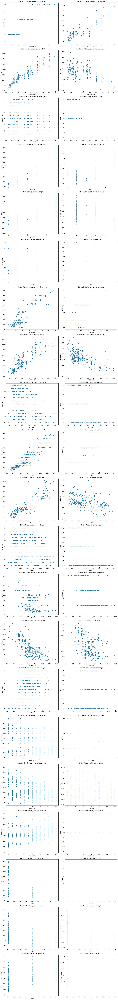

In [8]:
# Display all pairwise relationships in the dataset
column_pairs = [(col1, col2) for col1 in X.columns for col2 in X.columns if col1 != col2]
rows = (len(column_pairs) + 1) // 2
fig, axes = plt.subplots(rows, 2, figsize=(15, 6 * rows))
for i, (col1, col2) in enumerate(column_pairs):
    row = i // 2
    col = i % 2
    sns.scatterplot(x=X[col1], y=X[col2], ax=axes[row, col])
    axes[row, col].set_ylabel(col2)
    axes[row, col].set_xlabel(col1)
    axes[row, col].set_title(f'Scatter Plot of {col1} vs {col2}')

if len(column_pairs) % 2 != 0:
    axes[-1, -1].set_visible(False)

plt.tight_layout()
plt.show()

Coefficient: [-0.00767661], Intercept: [46.31736442]
[[19.41852276]
 [17.96764345]
 [19.94053224]
 [19.96356207]
 [19.84073631]
 [12.99320013]
 [12.8934042 ]
 [13.21582182]
 [12.34836489]
 [16.76241567]
 [18.96560276]
 [18.6124787 ]
 [17.44563397]
 [22.62734576]
 [28.10844535]
 [24.56952811]
 [25.0224481 ]
 [26.45797418]
 [29.96618498]
 [32.23078495]
 [25.80546233]
 [27.66320196]
 [28.08541552]
 [29.16781754]
 [25.98970097]
 [10.88980898]
 [12.72451878]
 [12.67845912]
 [ 9.9916456 ]
 [29.96618498]
 [28.93751924]
 [29.2138772 ]
 [30.61102023]
 [26.09717351]
 [19.91750241]
 [20.76192952]
 [20.96919799]
 [21.07667053]
 [14.00651266]
 [12.04897709]
 [14.42872621]
 [14.8739696 ]
 [ 8.27976155]
 [ 9.88417306]
 [ 6.85958869]
 [23.57924541]
 [27.83208739]
 [21.12273019]
 [22.22048543]
 [29.27529008]
 [30.01992125]
 [30.39607515]
 [30.46516464]
 [32.70673478]
 [33.93499239]
 [32.23846156]
 [31.30959175]
 [28.83004669]
 [29.99689142]
 [29.01428534]
 [27.83208739]
 [29.22923042]
 [13.50753301]
 [

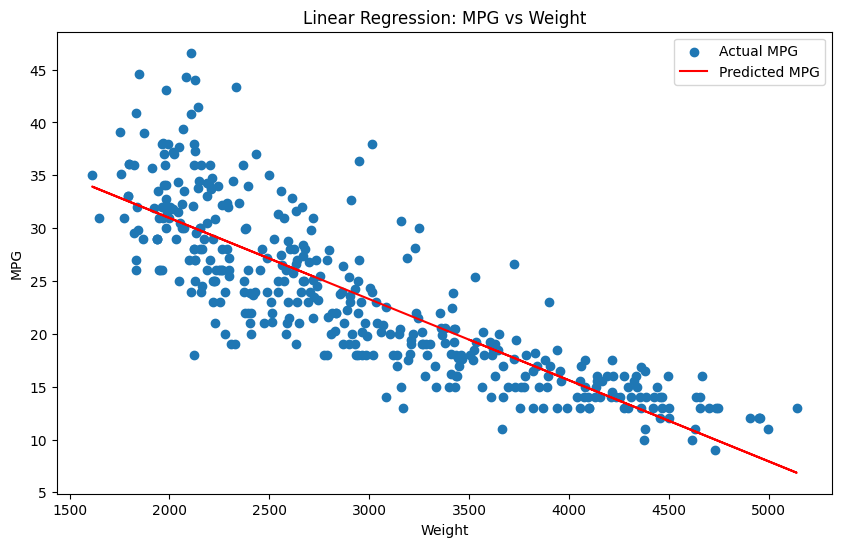

In [9]:
# Fit linear regression model tp predict 'mpg' from weight
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X[['weight']], y)
print(f"Coefficient: {model.coef_[0]}, Intercept: {model.intercept_}")
predicted_mpg = model.predict(X[['weight']])
print(predicted_mpg)

# Plot of the linear regression line (using matplotlib)
plt.figure(figsize=(10, 6))
plt.scatter(X['weight'].values, y, label='Actual MPG')
plt.plot(X['weight'].values, predicted_mpg.flatten(), color='red', label='Predicted MPG')
plt.xlabel('Weight')
plt.ylabel('MPG')
plt.title('Linear Regression: MPG vs Weight')
plt.legend()
plt.show()

Coefficients: [[-1.86423243e-02  1.71652679e-06]], Intercept: [62.51665222]
[[18.26949126]
 [17.08096835]
 [18.72710599]
 [18.74766049]
 [18.6383935 ]
 [13.93703559]
 [13.88871298]
 [14.04692291]
 [13.63503455]
 [16.186922  ]
 [17.88530512]
 [17.59406099]
 [16.68334966]
 [21.3336038 ]
 [27.95489785]
 [23.47960096]
 [24.01164872]
 [25.77693324]
 [30.59621186]
 [34.08791906]
 [24.9596489 ]
 [27.35172322]
 [27.92341594]
 [29.43646612]
 [25.18789854]
 [13.04129934]
 [13.80825798]
 [13.78660408]
 [12.73733938]
 [30.59621186]
 [29.10882451]
 [29.50236521]
 [31.56003697]
 [25.32195736]
 [18.70658238]
 [19.47931819]
 [19.67533914]
 [19.77796492]
 [14.46055026]
 [13.50305396]
 [14.69633586]
 [14.9562326 ]
 [12.28814394]
 [12.70411621]
 [12.04505646]
 [22.35793931]
 [27.57915411]
 [19.82215338]
 [20.91188571]
 [29.59042291]
 [30.67560541]
 [31.23607042]
 [31.339909  ]
 [34.85976299]
 [36.91258932]
 [34.10026345]
 [32.63151653]
 [28.95698248]
 [30.64155901]
 [29.21769508]
 [27.57915411]
 [29.5243

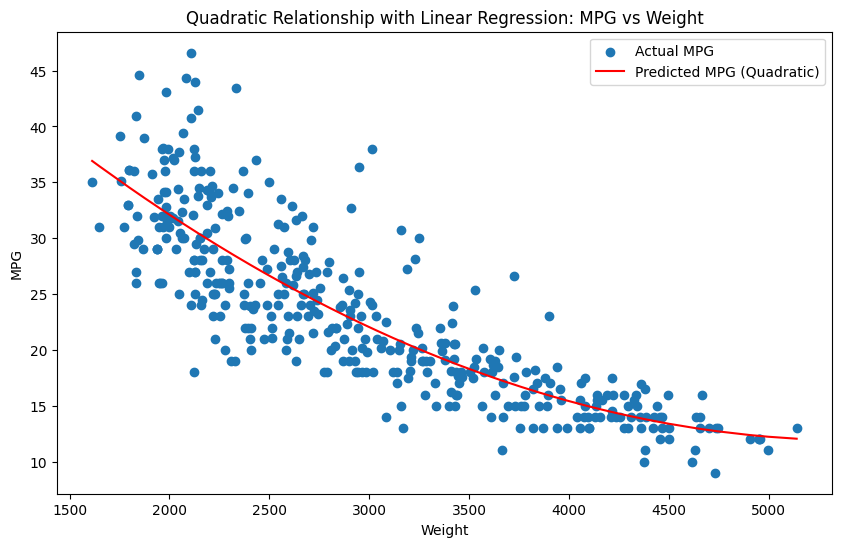

In [10]:
# Fit quadratic regression model to predict mpg from weight and weight^2
model = LinearRegression()
X_quadratic = X[['weight']].copy()
X_quadratic['weight_squared'] = X_quadratic['weight'] ** 2
model.fit(X_quadratic, y)
print(f"Coefficients: {model.coef_}, Intercept: {model.intercept_}")
predicted_mpg_quadratic = model.predict(X_quadratic)
print(predicted_mpg_quadratic)

# plot of the quadratic regression curve using matplotlib
plt.figure(figsize=(10, 6))
plt.scatter(X['weight'].values, y, label='Actual MPG')
sorted_indices = X['weight'].argsort()
plt.plot(X['weight'].values[sorted_indices], predicted_mpg_quadratic.flatten()[sorted_indices], color='red', label='Predicted MPG (Quadratic)')
plt.xlabel('Weight')
plt.ylabel('MPG')
plt.title('Quadratic Relationship with Linear Regression: MPG vs Weight')
plt.legend()
plt.show()

# Problem 4: Validation

You will download some data, and fit trees of different depth to the data. You will try to see which depth works best. The key idea here is simple but important: the deeper the tree, the lower the training error, **so we do not want to choose depth based on training error**. Instead, we will try to use testing error.


0. We already something very similar for regression in [this notebook](https://colab.research.google.com/drive/1mdpfeVgHWhNAN12uVl_mDPgsIZg4Bx4Z?usp=sharingLinks). Run through that to remind yourself of the logic and the flow.
1. Download the data ``L2_P4_dataset.npz`` from Canvas. Once you load the file onto Colab, you can load it using something like:
```
data = np.load("L2_P4_dataset.npz")
X = data["X"]
y = data["y"]
```
2. Do a train-test split (either manually, or using the train-test split command from ``sklearn``). Try 25% in testing, or some other fraction of your choice.
3. Fit trees of depth 1 to 5, and compute the training and testing error for each.
4. Plot the decision region for each depth tree (we have done this exact thing, so you can re-use code from our posted notebooks).
5. Is there a trend in the training error? Does this make sense? Why or why not?
6. Find which tree-depth (or which ones, if there are ties) has the lowest testing error. Is this conclusive?

In [11]:
# load in the data
data = np.load("L2_P4_dataset.npz")
X = data["X"]
y = data["y"]

print (X.shape, y.shape)
print(X[:5])
print(y[:5])

(100, 2) (100,)
[[7.71320643 0.20751949]
 [6.33648235 7.48803883]
 [4.98507012 2.24796646]
 [1.98062865 7.60530712]
 [1.69110837 0.88339814]]
[1. 0. 0. 0. 1.]


In [12]:
# train_test_split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=21)

Depth: 1, Train MSE: 0.2, Test MSE: 0.48


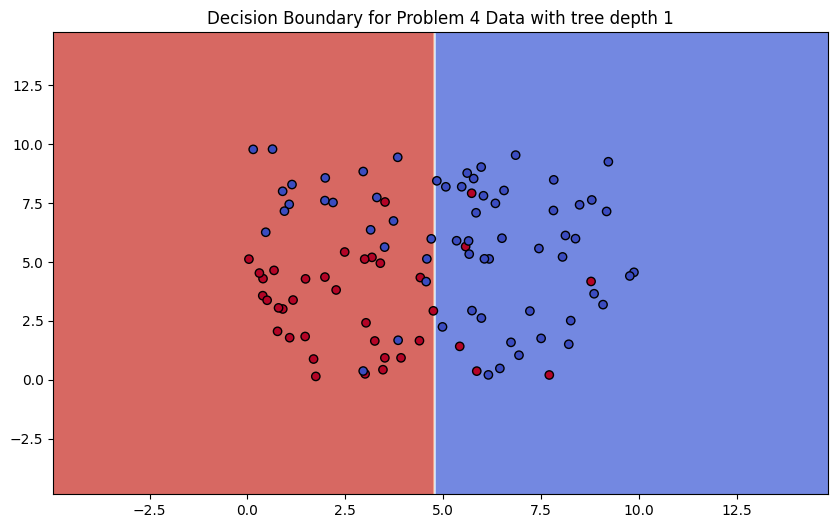

Depth: 2, Train MSE: 0.09333333333333334, Test MSE: 0.12


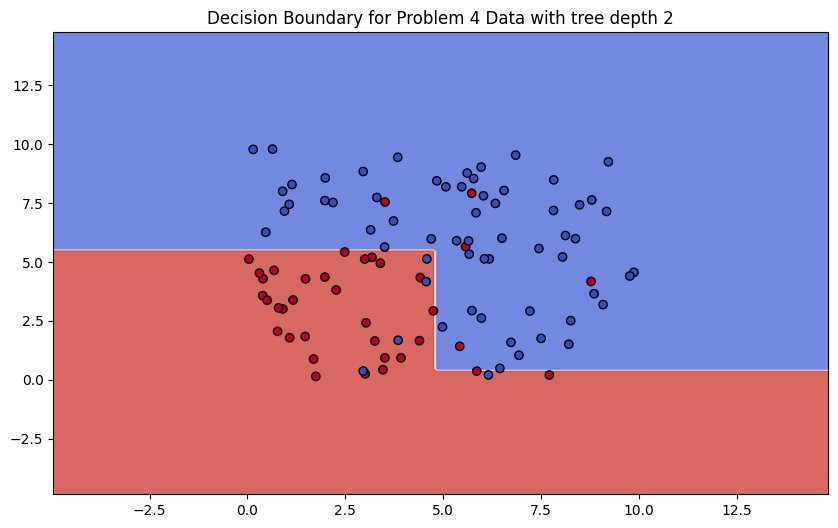

Depth: 3, Train MSE: 0.09333333333333334, Test MSE: 0.12


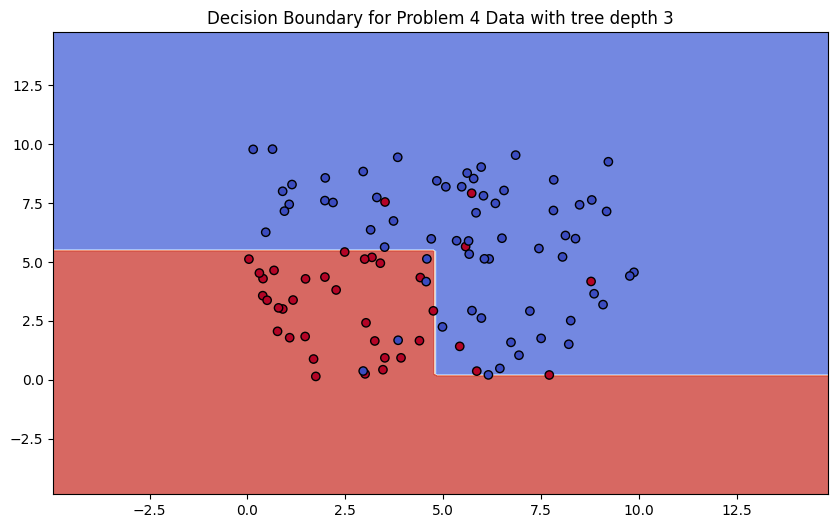

Depth: 4, Train MSE: 0.05333333333333334, Test MSE: 0.16


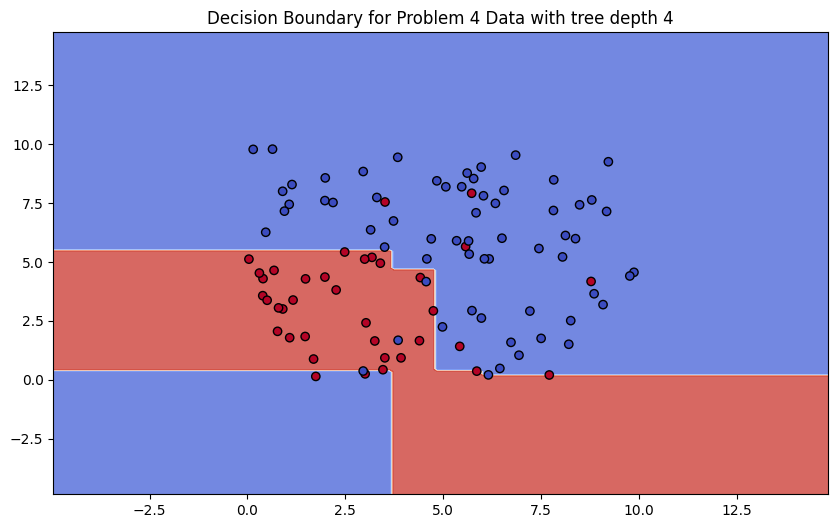

Depth: 5, Train MSE: 0.013333333333333334, Test MSE: 0.16


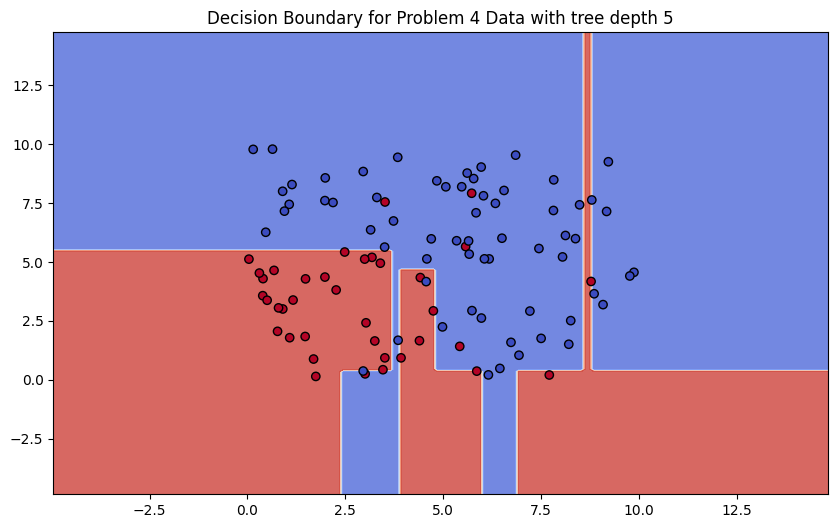

In [13]:
# Fit decsion trees from depth 1 to 5
from sklearn import tree
from sklearn.metrics import mean_squared_error

for depth in range(1, 6):
    model = tree.DecisionTreeClassifier(max_depth=depth)
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    train_mse = mean_squared_error(y_train, y_pred_train)
    y_pred_test = model.predict(X_test)
    test_mse = mean_squared_error(y_test, y_pred_test)
    print(f"Depth: {depth}, Train MSE: {train_mse}, Test MSE: {test_mse}")

    # plotting the decsion boundary
    x_min, x_max = X[:, 0].min() - 5, X[:, 0].max() + 5
    y_min, y_max = X[:, 1].min() - 5, X[:, 1].max() + 5

    # Create a meshgrid
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                        np.arange(y_min, y_max, 0.1))
    # Predict the outcome on the meshgrid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary
    plt.figure(figsize=(10, 6))
    plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.coolwarm)

    # Plot the training points
    scatter = plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, edgecolor='k')
    plt.title(f'Decision Boundary for Problem 4 Data with tree depth {depth}')
    plt.show()



The training error continues to decrease as we increase the depth of our decion tree model. This makes sence, since as we increase the depth of the decsion tree, we get more degrees of freedom to the point we have so much despite our data not being very complex. This leads to overfittnig since the model will have more variance as the model begins learning and becomes senstive to very small fluctuations in the training data which are not representative of the tesing data.

The tree deoth with the lowest testing error was a tie between the depth 1 and depth 2 decison trees. This is not entriley concclusive as this is with a speciifc train test split outcome where we trained on a speicif c subset and testing on another subset of the overall data. Though this split is random, we cannot say for sure that testing in our caase our y_test data in conlclusive of the whole distribution of data for evaluating the model's performance. Along with training, it could be said, that there is aproabblity we missed important data through the train test split as well. 

# Problem 5: Cross Validation

Let's now do the same thing, but with a more *data efficient* approach called **cross validation**.

In the above, we had a data set $(X,y)$ and we evaluated a particular model (tree of a certain depth) using 3/4 for training and 1/4 for testing.

We are going to do the same thing here, but in a more *data efficient* way: we will cut the data set into 4 pieces:
$$
(X,y) = (X_1,y_1) \cup (X_2,y_2) \cup (X_3,y_3) \cup (X_4,y_4).
$$
Instead of training on the first three pieces, testing on the last one, and calling it a day, we will repeat the process four times:
1. Train on $(X_1,y_1) \cup (X_2,y_2) \cup (X_3,y_3)$ and test on $(X_4,y_4)$. Call the error score $s_4$.
2. Train on $(X_1,y_1) \cup (X_2,y_2) \cup (X_4,y_4)$ and test on $(X_3,y_3)$. Call the error score $s_3$.
3. Train on $(X_1,y_1) \cup (X_3,y_3) \cup (X_4,y_4)$ and test on $(X_2,y_2)$. Call the error score $s_2$.
4. Train on $(X_2,y_2) \cup (X_3,y_3) \cup (X_4,y_4)$ and test on $(X_1,y_1)$. Call the error score $s_1$.
Then we finaly report:
$$
s = \frac{1}{4}\left(s_1+s_2+s_3+s_4\right).
$$
The process described is called **$k$-Fold Cross Validation**, where we have used $k=4$. So if we cut into 10 pieces instead of 4, we would have 10-Fold Cross Validation, etc.

1. Implement the above process manually. Thus, for each depth from 1 to 5, you will train a tree of that depth 4 times, and evaluate it 4 times. The final score for that tree depth will be the average of those four scores.

2. Report the scores for each tree depth.  If you do this correctly, you should find that tree depth = 2 has the lowest score. Moreover, we see that this gives us better resolution than the previous process, which only computed one of these scores.

3. (Optional but highly recommended) Repeat the process using the ``cross_val_score`` from ``sklearn``:
```
from sklearn.model_selection import cross_val_score
```
and then try it again (even simpler) using
```
from sklearn.model_selection import GridSearchCV
```

In [14]:
# 4-fold cross validation
fold_size = len(X) // 4 # split data into 4 folds

for depth in range(1, 6):
    cv_scores  = []
    for i in range(4):
        start = i * fold_size
        end = (i + 1) * fold_size if i < 3 else len(X) # find indices for the test fold
        test_indices = list(range(start, end))
        train_indices = [j for j in range(len(X)) if j not in test_indices]
        
        # Split data
        X_train_cv = X[train_indices]
        X_test_cv = X[test_indices]
        y_train_cv = y[train_indices]
        y_test_cv = y[test_indices]

        # Fit model and average
        model = tree.DecisionTreeClassifier(max_depth=depth)
        model.fit(X_train_cv, y_train_cv)
        y_pred_cv = model.predict(X_test_cv)
        mse_cv = mean_squared_error(y_test_cv, y_pred_cv)
        cv_scores.append(mse_cv)
    
    avg_mse = np.mean(cv_scores)
    print(f"Depth: {depth}, Average CV MSE: {avg_mse}")



Depth: 1, Average CV MSE: 0.29000000000000004
Depth: 2, Average CV MSE: 0.14
Depth: 3, Average CV MSE: 0.17
Depth: 4, Average CV MSE: 0.19
Depth: 5, Average CV MSE: 0.26


In [15]:
# Different hyperparameter tuning methods
from sklearn.model_selection import cross_val_score, GridSearchCV

# use corss val but cross val scoring mse only accepts neg_mean_squared_error
for depth in range(1, 6):
    model = tree.DecisionTreeClassifier(max_depth=depth)
    cv_scores = cross_val_score(model, X, y, cv=4, scoring='neg_mean_squared_error')
    avg_mse = -np.mean(cv_scores)
    print(f"Depth: {depth}, Average CV MSE: {avg_mse}")

Depth: 1, Average CV MSE: 0.3
Depth: 2, Average CV MSE: 0.16
Depth: 3, Average CV MSE: 0.22
Depth: 4, Average CV MSE: 0.22
Depth: 5, Average CV MSE: 0.23


In [16]:
# Grid search cross validation
param_grid = {'max_depth': range(1, 6)}
model = tree.DecisionTreeClassifier()
grid_search = GridSearchCV(model, param_grid, cv=4, scoring='neg_mean_squared_error')
grid_search.fit(X, y)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best CV MSE: {-grid_search.best_score_}")

Best parameters: {'max_depth': 2}
Best CV MSE: 0.16
